## Machine Learning:  Logistic Regression with PCA

AIDI 1002 - Exercise 3

Michael Molnar (100806823)

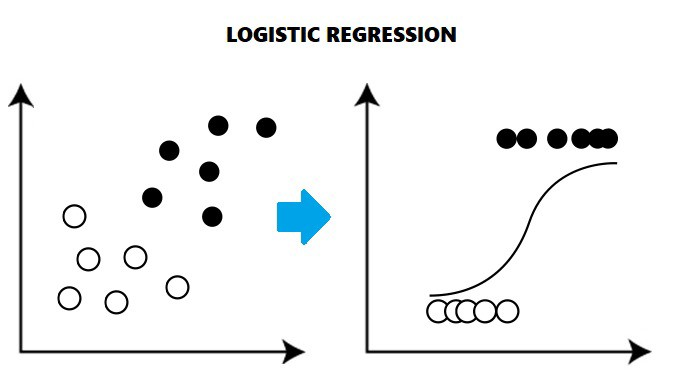

In [1]:
from IPython.display import Image
Image(filename = 'Logistic Regression.jpeg')

Image Source: https://medium.com/analytics-vidhya/understanding-logistic-regression-b3c672deac04

### Problem Description

We are given a number of indicators for a person and want to predict whether their yearly income will be greater or less than $50,000.  These indicators relate to sex, race, education, occupation, marital status, location, work hours, and capital gains and loses.  This notebook will comprise of a thorough examination of the data before feature engineering and model fitting.  Logistic Regression will be the main algorithm analyzed but others will be tested as well for comparison.  Finally, Principal Component Analysis will be performed and its effect on the accuracy of the Logistic Regression model will be determined.  The goal is to maximize the accuracy of the Logistic Regression model and examine the effects of changing the number of features has on this accuracy.

### Loading the Necessary Libraries

In [2]:
import numpy as np
import pandas as pd
import sweetviz as sv
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA

import plotly.express as px
import plotly.graph_objs as go

### Loading and Examining the Data

<b> The dataset:</b>

This analysis will be performed on the Adult Census Income dataset shared by UCI Machine Learning.  The data was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker and is made available at https://www.kaggle.com/uciml/adult-census-income.

In [3]:
# Load the CSV into a Pandas DataFrame
df_adultcensus = pd.read_csv('adult.csv')

In [4]:
df_adultcensus.shape

(32561, 15)

In [5]:
df_adultcensus.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


Just looking at the first five of the 32,561 rows I see the presence of question marks.  I will deal with these in the data cleaning and feature engineering section of this analysis. There are 15 columns in the dataset - the class to be predicted (income), six numeric features and 8 categorical features.

In [6]:
df_adultcensus.describe()

,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


Some characteristics to note here in the numeric features of the data.  "fnlwgt" is very very large compared to the other feature values.  This will be examined and then dealt with by standardization of the data.  Capital gain and capital loss have at least 75% of their values as 0, but then both have some very high values as well.

Prepare a Sweet Viz Report

In [7]:
census_report = sv.analyze(df_adultcensus)

:FEATURES DONE:                    |█████████████████████| [100%]   00:03  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:03  -> (00:00 left)


Creating Associations graph... DONE!


In [8]:
census_report.show_html()

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.


### Examine the Target Variable:  Income

In [7]:
# Get the counts
df_adultcensus['income'].value_counts()

<=50K    24720
>50K      7841
Name: income, dtype: int64

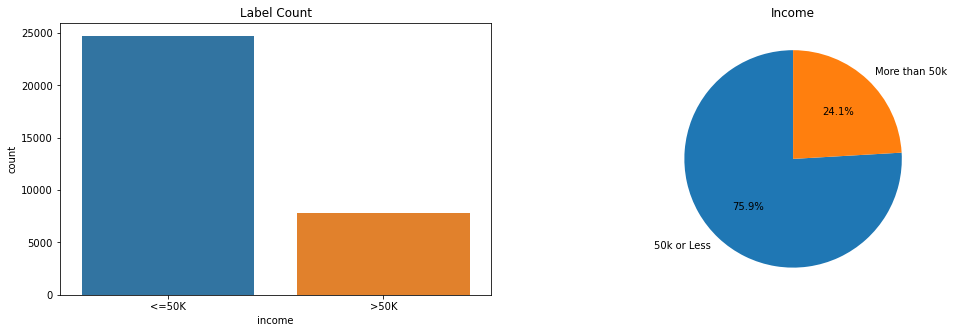

In [8]:
# Plot as a bar graph and a pie graph
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax = sns.countplot(df_adultcensus['income'])
ax.set_title('Label Count')

ax2 = f.add_subplot(122)
labels = ['50k or Less', 'More than 50k']
sizes = [24720/32561, 7841/32561]

ax2 = plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title("Income")

plt.show()

75.9% of the rows belong to the income 50k or less class and 24.1% to the more than 50k class. 

In [9]:
# Encode the targets with 0 for <=50k and 1 for >50k
df_adultcensus['income'] = df_adultcensus['income'].map({'<=50K': 0, '>50K': 1})

### Examining the Categorical Features

There are eight categorical features - I will plot and examine each of them individually. 

#### Work Class 

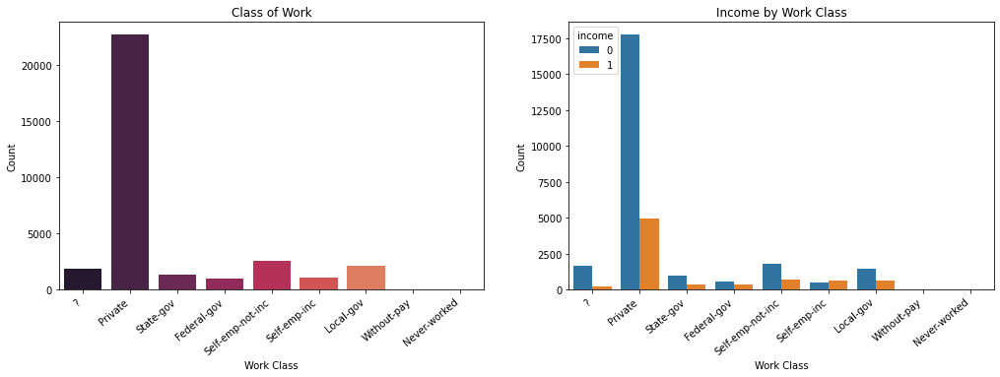

In [10]:
# Plot the distribution and then the distributions according to the class labels
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax=sns.countplot(x='workclass', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Work Class')
ax.set_ylabel('Count')
ax.set_title('Class of Work')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'workclass', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Work Class')
ax2.set_ylabel('Count')
ax2.set_title('Income by Work Class')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

We see here the presence of question marks.  The vast majority of people in the dataset work in the private sector, and then vast majority of these people make under 50k.  All classes except self-employed-inc have more people earning less than 50K then more than 50k.

#### Education

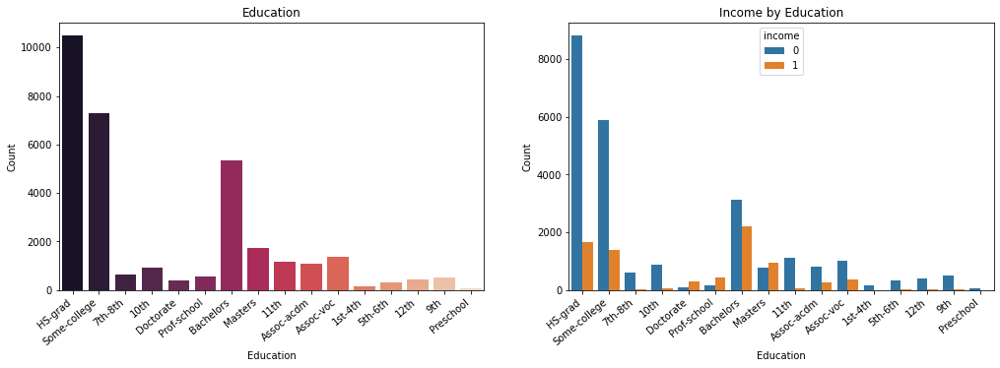

In [11]:
f= plt.figure(figsize=(17,5))
ax=f.add_subplot(121)
ax=sns.countplot(x='education', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Education')
ax.set_ylabel('Count')
ax.set_title('Education')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'education', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Education')
ax2.set_ylabel('Count')
ax2.set_title('Income by Education')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

For education there are three large classes - high school grad, some college, and bachelors.  There is an expected trend in this data - the more education, the more likelihood you are to earn over 50k.  A bachelor's degree is almost split between the two income levels, and higher education than that (masters, prof-school, doctorate) see people more likely than not to earn the higher income.

#### Marital Status

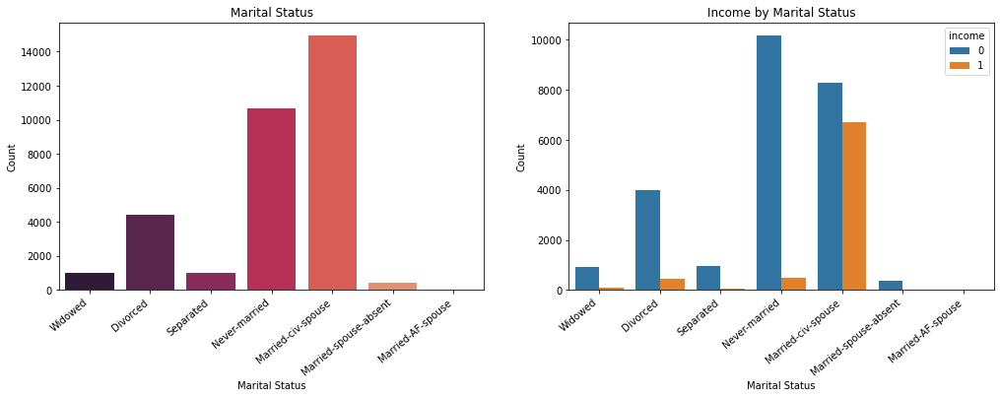

In [12]:
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax=sns.countplot(x='marital.status', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Marital Status')
ax.set_ylabel('Count')
ax.set_title('Marital Status')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'marital.status', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Marital Status')
ax2.set_ylabel('Count')
ax2.set_title('Income by Marital Status')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

Most of the people in the sample are married or never married, as opposed to divorced, widowed or separated.  People who have never been married are very likely to earn a lower income, and people who are married are almost split between the two income classes.

#### Occupation

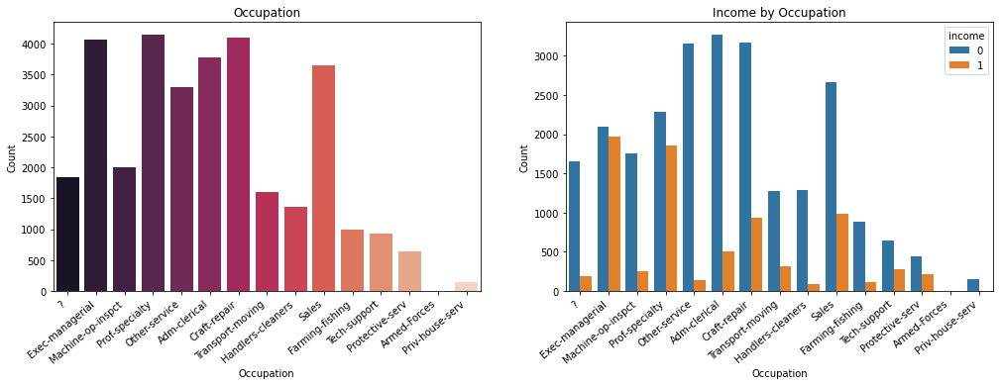

In [13]:
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax=sns.countplot(x='occupation', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Occupation')
ax.set_ylabel('Count')
ax.set_title('Occupation')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'occupation', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Occupation')
ax2.set_ylabel('Count')
ax2.set_title('Income by Occupation')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

Again we have the presence of question marks in this column.  We have data for a wide range of occupations.  There are some occupations where you are almost equally likely to earn either income class - executive-managerial and prof-speciality, for example.  Certain occupations make it very unlikely to earn the higher income - admin-clerical, transport, and cleaning, for example.

#### Relationship Status

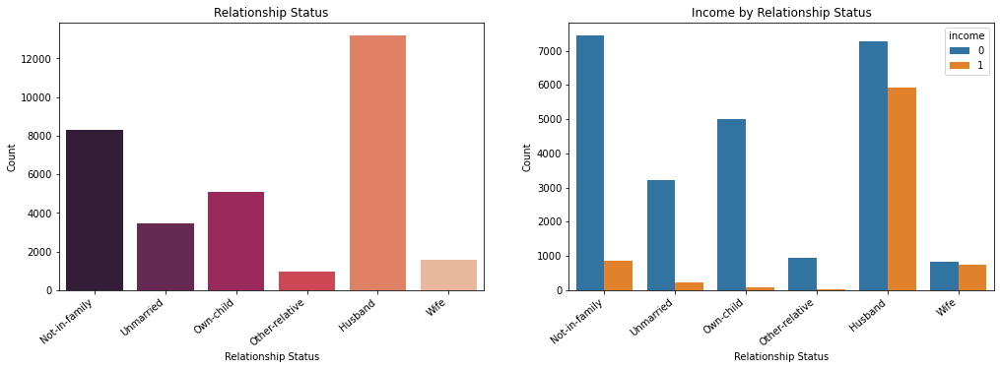

In [14]:
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax=sns.countplot(x='relationship', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Relationship Status')
ax.set_ylabel('Count')
ax.set_title('Relationship Status')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'relationship', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Relationship Status')
ax2.set_ylabel('Count')
ax2.set_title('Income by Relationship Status')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

As with the marital status column, married men and women have the best likelihood of earning the higher income.  People who are unmarried with no family generally earn the lower income.

#### Race

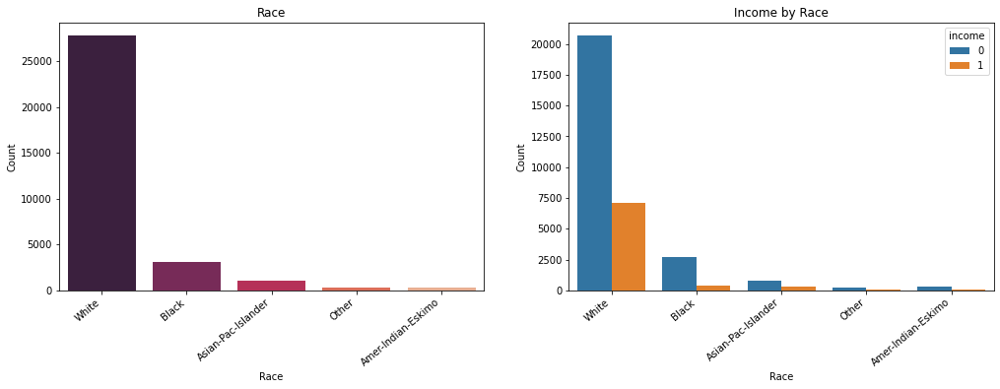

In [15]:
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax=sns.countplot(x='race', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Race')
ax.set_ylabel('Count')
ax.set_title('Race')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'race', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Race')
ax2.set_ylabel('Count')
ax2.set_title('Income by Race')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

The vast majority of the sample represents white people.  For each of the categories more people earn less than 50k. 

In [16]:
# Get the counts
df_adultcensus['race'].value_counts()

White                 27816
Black                  3124
Asian-Pac-Islander     1039
Amer-Indian-Eskimo      311
Other                   271
Name: race, dtype: int64

27,816 of the 32,561 (about 85%) of the data is respresntative of white people.  After the initial model evaluation I will remove this feature and see the effect that it has.  

#### Sex 

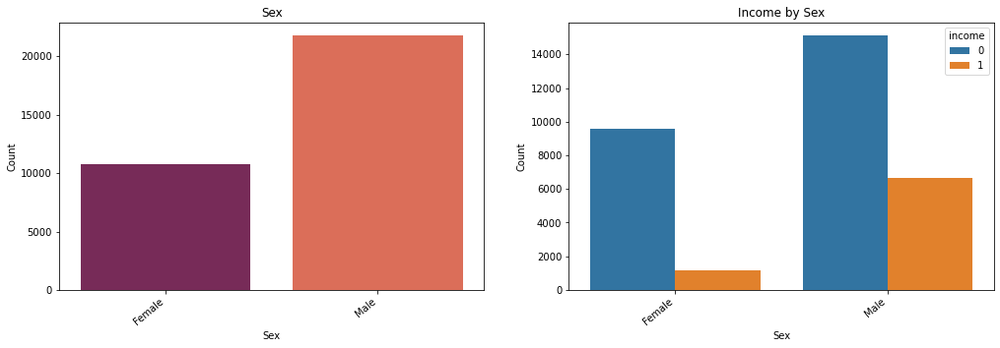

In [17]:
f= plt.figure(figsize=(17,5))

ax=f.add_subplot(121)
ax=sns.countplot(x='sex', data=df_adultcensus, palette='rocket')
ax.set_xlabel('Sex')
ax.set_ylabel('Count')
ax.set_title('Sex')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

ax2=f.add_subplot(122)
sns.countplot(x = 'sex', hue = 'income', data = df_adultcensus)
ax2.set_xlabel('Sex')
ax2.set_ylabel('Count')
ax2.set_title('Income by Sex')
ax2.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.show()

There are about double the number of males as females in the data, and the plot shows that men are more likely to be in the higher income class the females are.

#### Native Country

First I get the value counts.

In [18]:
df_adultcensus['native.country'].value_counts()

United-States                 29170
Mexico                          643
?                               583
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
Greece                      

29,170 of the 32,561 (about 90%) of the data represents the United States. 

In [19]:
len(df_adultcensus['native.country'].unique())

42

There are 42 two countries represented - meaning 41 of the 42 countries account for just about 10% of the data.  To plot these distributions I will plot American data separately and then group the other 41 countries into non-American.

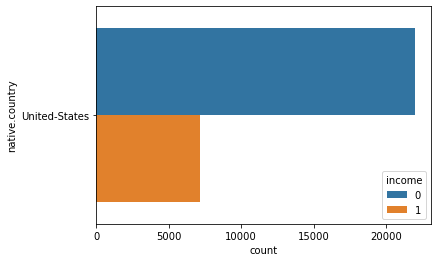

In [20]:
# Retrieve rows where native country is United States
df_USA = df_adultcensus[df_adultcensus['native.country'] == 'United-States']
sns.countplot(y = 'native.country', hue = 'income', data = df_USA )

In [21]:
# Get all the countries
countries = df_adultcensus['native.country'].unique()
countries

array(['United-States', '?', 'Mexico', 'Greece', 'Vietnam', 'China',
       'Taiwan', 'India', 'Philippines', 'Trinadad&Tobago', 'Canada',
       'South', 'Holand-Netherlands', 'Puerto-Rico', 'Poland', 'Iran',
       'England', 'Germany', 'Italy', 'Japan', 'Hong', 'Honduras', 'Cuba',
       'Ireland', 'Cambodia', 'Peru', 'Nicaragua', 'Dominican-Republic',
       'Haiti', 'El-Salvador', 'Hungary', 'Columbia', 'Guatemala',
       'Jamaica', 'Ecuador', 'France', 'Yugoslavia', 'Scotland',
       'Portugal', 'Laos', 'Thailand', 'Outlying-US(Guam-USVI-etc)'],
      dtype=object)

In [22]:
# Remove the United States from the list 
nonUS = countries[1:]
nonUS 

array(['?', 'Mexico', 'Greece', 'Vietnam', 'China', 'Taiwan', 'India',
       'Philippines', 'Trinadad&Tobago', 'Canada', 'South',
       'Holand-Netherlands', 'Puerto-Rico', 'Poland', 'Iran', 'England',
       'Germany', 'Italy', 'Japan', 'Hong', 'Honduras', 'Cuba', 'Ireland',
       'Cambodia', 'Peru', 'Nicaragua', 'Dominican-Republic', 'Haiti',
       'El-Salvador', 'Hungary', 'Columbia', 'Guatemala', 'Jamaica',
       'Ecuador', 'France', 'Yugoslavia', 'Scotland', 'Portugal', 'Laos',
       'Thailand', 'Outlying-US(Guam-USVI-etc)'], dtype=object)

In [23]:
# Retrieve all the non-United States rows
df_nonUS = df_adultcensus.copy()
df_nonUS = df_nonUS[df_nonUS['native.country'] != 'United-States']
df_nonUS['native.country'].replace(nonUS, 'non-United States', inplace=True)

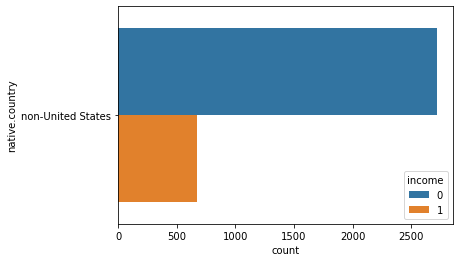

In [24]:
sns.countplot(y = 'native.country', data = df_nonUS,  hue = 'income')

The distributions are pretty similar between the two plots.  As with race, this is a feature that will be removed in the second phase of modelling since it is not giving us much indication of the income class and 90% of the data respresents the United States.

### Examining the Numeric Features

There are six numeric features.  The first thing I will do is plot their correlations to the target income and to each other.

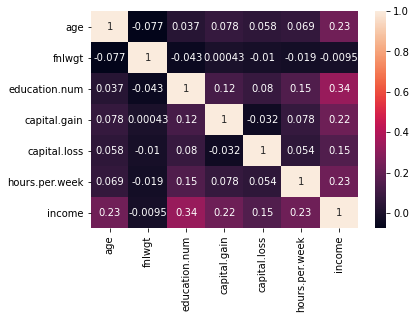

In [25]:
plt.figure()
sns.heatmap(df_adultcensus.corr(), annot=True)

The feature "fnlwgt" is not very correlated with anything and will probably be removed.  We see that the rest of the features all have correlation with income and thus seem important to keep. 

### Age

In [26]:
df_adultcensus['age'].describe()

count    32561.000000
mean        38.581647
std         13.640433
min         17.000000
25%         28.000000
50%         37.000000
75%         48.000000
max         90.000000
Name: age, dtype: float64

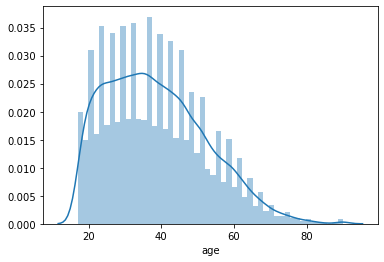

In [27]:
sns.distplot(df_adultcensus['age'])

Age looks relatively normally distributed, with an average of 38.5.  The range is from 17 to 90 and the distribution does show positive skew.  We can plot this distribution split by the two class labels next.

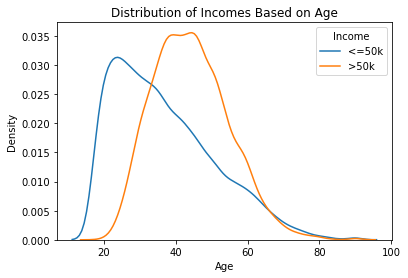

In [28]:
fig, ax = plt.subplots()
sns.distplot(df_adultcensus[(df_adultcensus.income == 0)]["age"],ax=ax, hist=False, label = '<=50k')
sns.distplot(df_adultcensus[(df_adultcensus.income == 1)]['age'],ax=ax, hist=False, label = '>50k')
ax.set_title('Distribution of Incomes Based on Age')
ax.set_ylabel('Density')
ax.set_xlabel('Age')
plt.legend(title = 'Income')

Younger people are much more likely to be making less income, people aged about 35 to 65 are more likely to be earning more, and then both distributions tail off from there.  

### Fnlwgt

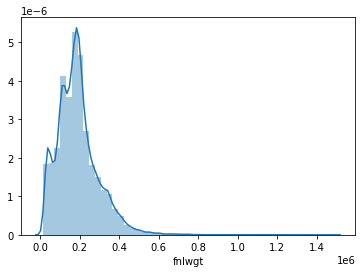

In [29]:
ax = sns.distplot(df_adultcensus['fnlwgt'])

This feature has a massive scale, with most of the data being centred around about 200,000.  The distribution appears normal with positive skew again.

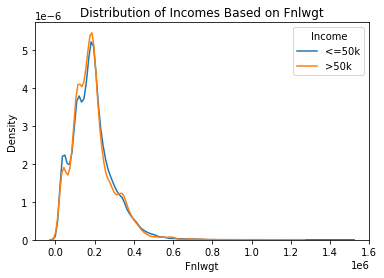

In [30]:
fig, ax = plt.subplots()
sns.distplot(df_adultcensus[(df_adultcensus.income == 0)]["fnlwgt"],ax=ax, hist=False, label = '<=50k')
sns.distplot(df_adultcensus[(df_adultcensus.income == 1)]['fnlwgt'],ax=ax, hist=False, label = '>50k')
ax.set_title('Distribution of Incomes Based on Fnlwgt')
ax.set_ylabel('Density')
ax.set_xlabel('Fnlwgt')
plt.legend(title = 'Income')

From this plot we see there is almost no separation between the two target classes.  As with race and native country I will eventually see the impact removing this feature has on the performance of the learning algorithms.  

#### Hours of Work Per Week

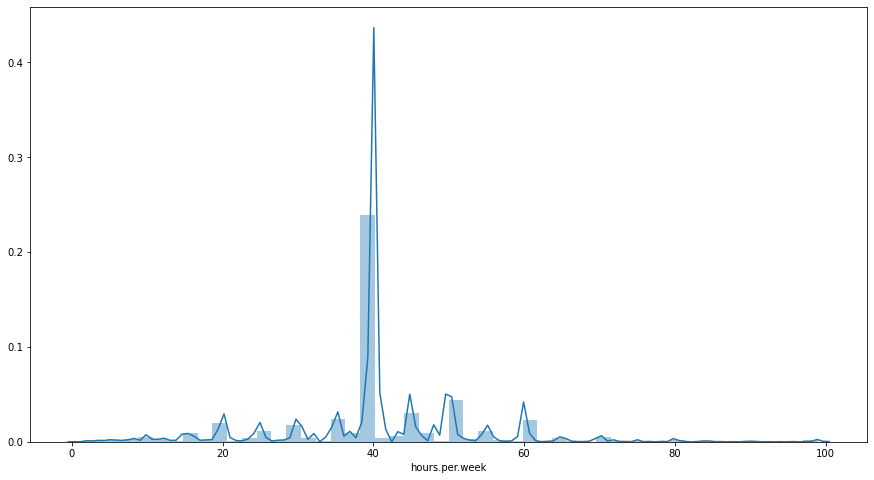

In [31]:
plt.figure(figsize=(15,8))
sns.distplot(df_adultcensus['hours.per.week'])

The vast majority of people work about 40 hours per week, which is considered to be full time work.  We see a fair amount of people work 40 - 60 hours, some work 20-40, and a few work lower than 20 or above 60.

In [32]:
df_adultcensus['hours.per.week'].describe()

count    32561.000000
mean        40.437456
std         12.347429
min          1.000000
25%         40.000000
50%         40.000000
75%         45.000000
max         99.000000
Name: hours.per.week, dtype: float64

The range of hours worked per week spans 1 to 99. 

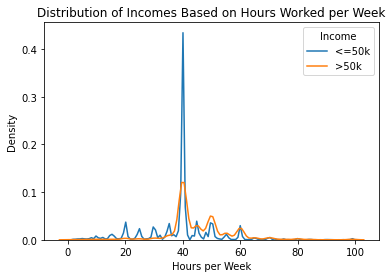

In [33]:
fig, ax = plt.subplots()
sns.distplot(df_adultcensus[(df_adultcensus.income == 0)]["hours.per.week"],ax=ax, hist=False, label = '<=50k')
sns.distplot(df_adultcensus[(df_adultcensus.income == 1)]['hours.per.week'],ax=ax, hist=False, label = '>50k')
ax.set_title('Distribution of Incomes Based on Hours Worked per Week')
ax.set_ylabel('Density')
ax.set_xlabel('Hours per Week')
plt.legend(title = 'Income')

People who work under 40 hours per week are more likely to earn under 50k, and people who work above 40 hours are more likely to earn more.  

I look at the people who work 99 hours per week.

In [34]:
df_99 = df_adultcensus[df_adultcensus['hours.per.week']==99]

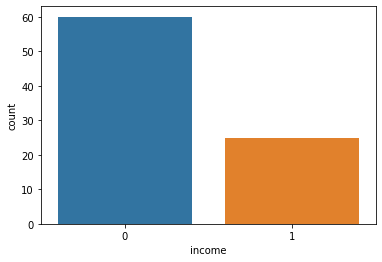

In [35]:
sns.countplot(df_99['income'])

Though the count is extremely small in the total dataset, less than 100 of the more than 30,000 rows, it is interesting that more of these people earn less than the 50k.  This could be due to the fact that there are some international countries represetned in the data who may or may not have a minimum wage in place.

#### Capital Gain

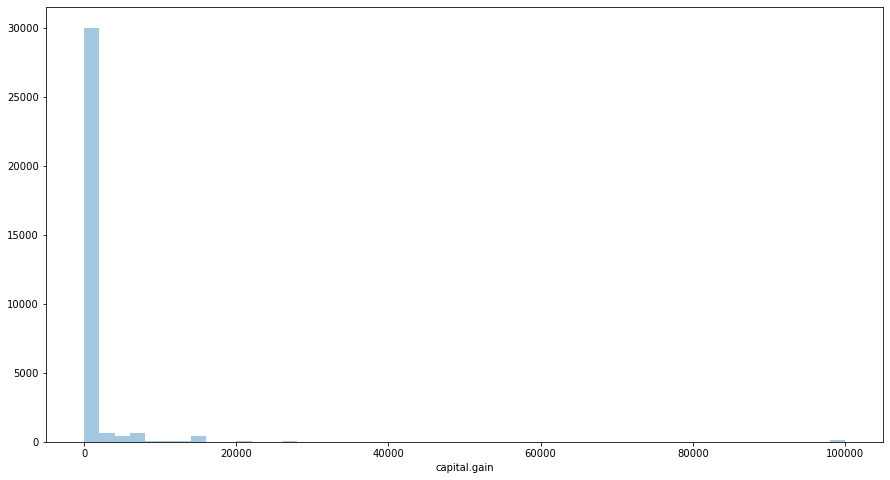

In [36]:
plt.figure(figsize=(15,8))
sns.distplot(df_adultcensus['capital.gain'], kde=False)

As was noted at the beginning, the vast majority of the rows have a value of 0 for this column.  There are some outliers close to 100,000 though.  We saw from the correlation plot though that this variable does impact on income, but I will look to remove these extreme outliers later in the analysis.

#### Capital Loss

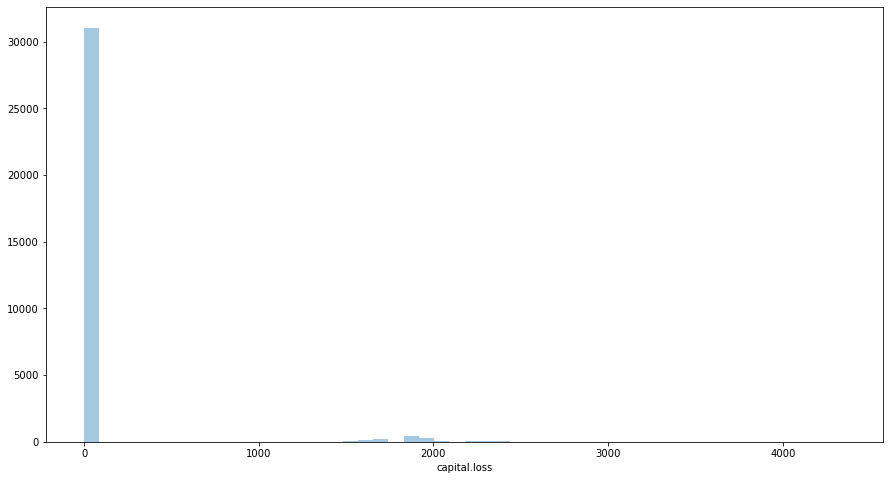

In [37]:
plt.figure(figsize=(15,8))
sns.distplot(df_adultcensus['capital.loss'], kde=False)

Again, this is the same as capital gain but to a lesser extreme.  The vast majority of values are 0 but there are some high outliers, though not as high as with capital gain.  

#### Education Number

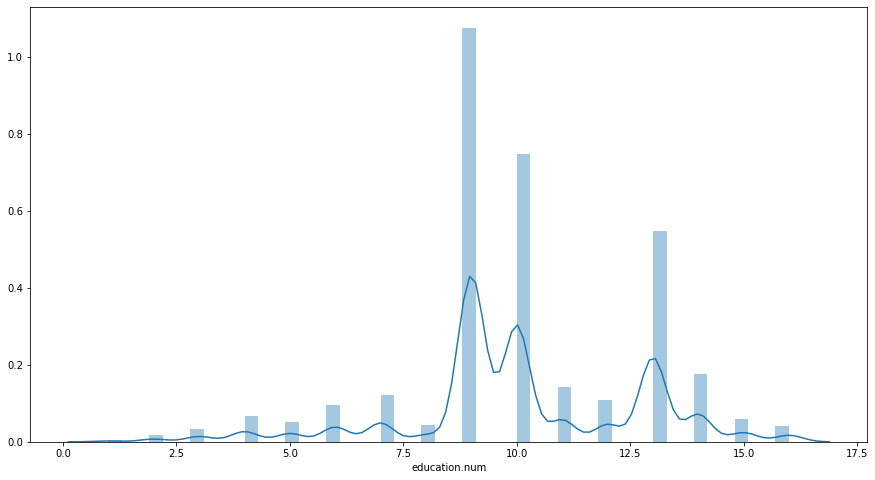

In [38]:
plt.figure(figsize=(15,8))
sns.distplot(df_adultcensus['education.num'])

This distribution has three distinct peaks.  I suspect that education and education number are both measuring the same thing and will confirm this in the next section of the report.

### Data Cleaning and Feature Engineering

First I can use Pandas' crosstab function to see the frequencies of the two features education and education number.

In [39]:
pd.crosstab(df_adultcensus['education.num'], df_adultcensus['education'])

education,10th,11th,12th,1st-4th,5th-6th,7th-8th,9th,Assoc-acdm,Assoc-voc,Bachelors,Doctorate,HS-grad,Masters,Preschool,Prof-school,Some-college
education.num,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,0,0,0,51,0,0
2,0,0,0,168,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,333,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,646,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,514,0,0,0,0,0,0,0,0,0
6,933,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,1175,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,433,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,10501,0,0,0,0


We can see that each value of education.num is associated to exactly one value of education.  These two features are the same and education will be dropped.

In [40]:
df_adultcensus.drop(columns='education', inplace=True)

### Dealing with the Question Marks

In [41]:
# Replace the question marks with NaN so that I can count the null values
df_adultcensus.replace('?', np.nan, inplace=True)

In [42]:
df_adultcensus

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,NaN,77053,9,Widowed,NaN,Not-in-family,White,Female,0,4356,40,United-States,0
1,82,Private,132870,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,0
2,66,NaN,186061,10,Widowed,NaN,Unmarried,Black,Female,0,4356,40,United-States,0
3,54,Private,140359,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,0
4,41,Private,264663,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,0
32557,27,Private,257302,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,0
32558,40,Private,154374,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,1
32559,58,Private,151910,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,0


In [43]:
# Count null values
df_adultcensus.isnull().sum()

age                  0
workclass         1836
fnlwgt               0
education.num        0
marital.status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital.gain         0
capital.loss         0
hours.per.week       0
native.country     583
income               0
dtype: int64

These question marks appears in three of the categorical columns - workclass, occupation and native.country.  I will generate the counts for each and determine the mode of each feature.  I will replace each question mark with the corresponding mode.

In [44]:
df_adultcensus['workclass'].value_counts()

Private             22696
Self-emp-not-inc     2541
Local-gov            2093
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64

In [45]:
df_adultcensus['occupation'].value_counts()

Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3770
Sales                3650
Other-service        3295
Machine-op-inspct    2002
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: occupation, dtype: int64

In [46]:
df_adultcensus['native.country'].value_counts()

United-States                 29170
Mexico                          643
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
Greece                           29
France                      

In [47]:
# Replace question marks with modes
for col in ['workclass', 'occupation', 'native.country']:
    df_adultcensus[col].fillna(df_adultcensus[col].mode()[0], inplace=True)

In [48]:
# Confirm there are no longer any null values
df_adultcensus.isnull().sum()

age               0
workclass         0
fnlwgt            0
education.num     0
marital.status    0
occupation        0
relationship      0
race              0
sex               0
capital.gain      0
capital.loss      0
hours.per.week    0
native.country    0
income            0
dtype: int64

In [49]:
# Print the updated dataframe
df_adultcensus

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,Private,77053,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,United-States,0
1,82,Private,132870,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,0
2,66,Private,186061,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,United-States,0
3,54,Private,140359,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,0
4,41,Private,264663,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,0
32557,27,Private,257302,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,0
32558,40,Private,154374,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,1
32559,58,Private,151910,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,0


Since United States represents about 90% of the native country feature I will group all of the other smaller classes together. I will give United States a value of 0 and all other countries a value of 1. 

In [50]:
df_adultcensus['native.country'] = np.where(df_adultcensus['native.country']=='United-States', 0, 1)

Now I split the dataframe into X and y.  I make a copy for later analysis before scaling and encoding the complete dataframe with just the column education removed.

In [51]:
X2 = df_adultcensus.copy()

In [52]:
X2

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,Private,77053,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,0,0
1,82,Private,132870,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,0,0
2,66,Private,186061,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,0,0
3,54,Private,140359,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,0,0
4,41,Private,264663,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,0,0
32557,27,Private,257302,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,0,0
32558,40,Private,154374,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,0,1
32559,58,Private,151910,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,0,0


In [53]:
# Set the target as y and the rest as X
y = df_adultcensus['income']
X = df_adultcensus.drop(columns=['income'])

I will now scale all of the numeric features.  For this I will use Robust Scaler becuase of the presence of outliers in some of the features.  Robust Scaler scales is not as affected by outliers as the Standard Scaler is becuase involves subtracting by the median rathan the mean.

In [54]:
# Get the numeric features
census_numeric = X[['age', 'fnlwgt', 'capital.gain', 'capital.loss', 'hours.per.week']].values

In [55]:
# Scale the numeric features
census_scaler = RobustScaler()
census_numerical_scaled = census_scaler.fit_transform(census_numeric)

In [56]:
# Replace these scaled features back into X
X[['age', 'fnlwgt', 'capital.gain', 'capital.loss', 'hours.per.week']] = census_numerical_scaled

In [57]:
X

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country
0,2.65,Private,-0.849686,9,Widowed,Prof-specialty,Not-in-family,White,Female,0.0,4356.0,0.0,0
1,2.25,Private,-0.381517,9,Widowed,Exec-managerial,Not-in-family,White,Female,0.0,4356.0,-4.4,0
2,1.45,Private,0.064626,10,Widowed,Prof-specialty,Unmarried,Black,Female,0.0,4356.0,0.0,0
3,0.85,Private,-0.318703,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0.0,3900.0,0.0,0
4,0.20,Private,0.723906,10,Separated,Prof-specialty,Own-child,White,Female,0.0,3900.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,-0.75,Private,1.105449,10,Never-married,Protective-serv,Not-in-family,White,Male,0.0,0.0,0.0,0
32557,-0.50,Private,0.662165,12,Married-civ-spouse,Tech-support,Wife,White,Female,0.0,0.0,-0.4,0
32558,0.15,Private,-0.201151,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0.0,0.0,0.0,0
32559,1.05,Private,-0.221818,9,Widowed,Adm-clerical,Unmarried,White,Female,0.0,0.0,0.0,0


Next I use the Label Encoder to transform the categorical features into numbers. 

In [58]:
categorical = ['workclass', 'marital.status', 'occupation', 'relationship', 'race', 'sex']
for feature in categorical:
        label_encode = LabelEncoder()
        X[feature] = label_encode.fit_transform(X[feature])

This is now the dataset prepared for the learning algorithms.

In [59]:
X

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country
0,2.65,3,-0.849686,9,6,9,1,4,0,0.0,4356.0,0.0,0
1,2.25,3,-0.381517,9,6,3,1,4,0,0.0,4356.0,-4.4,0
2,1.45,3,0.064626,10,6,9,4,2,0,0.0,4356.0,0.0,0
3,0.85,3,-0.318703,4,0,6,4,4,0,0.0,3900.0,0.0,0
4,0.20,3,0.723906,10,5,9,3,4,0,0.0,3900.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,-0.75,3,1.105449,10,4,10,1,4,1,0.0,0.0,0.0,0
32557,-0.50,3,0.662165,12,2,12,5,4,0,0.0,0.0,-0.4,0
32558,0.15,3,-0.201151,9,2,6,0,4,1,0.0,0.0,0.0,0
32559,1.05,3,-0.221818,9,6,0,4,4,0,0.0,0.0,0.0,0


### ML Classifiers and Datasets

In [60]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

I will first examine the Logistic Regression algorithm and then examine a couple of other classification algorithms.

In [61]:
# Create and fit the classifier on the training data
lr = LogisticRegression()
lr.fit(X_train, y_train)

# Get the predictions for the training and testing data
yhat_train = lr.predict(X_train)
yhat_test = lr.predict(X_test)

C:\Users\mdjm0\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


### Measuring Accuracy

I will generate the accuracy score for the training and testing datasets, as well as produce the confusion matrix.

In [62]:
acc_lr_train = accuracy_score(yhat_train, y_train)
acc_lr_test = accuracy_score(yhat_test, y_test)
conf_lr = confusion_matrix(y_test, yhat_test)

In [63]:
print('Logistic Regression Training Accuracy:', acc_lr_train)
print('Logistic Regression Test Accuracy:', acc_lr_test)
print('Logistic Regression Confusion Matrix\n', conf_lr)

Logistic Regression Training Accuracy: 0.8093629343629344
Logistic Regression Test Accuracy: 0.807349779916061
Logistic Regression Confusion Matrix
 [[7020  390]
 [1492  867]]


We see about 80% accuracy on both the training and testing datasets.  From the confusion matrix, there are 1492 false negatives and 390 false positives.  I will try a different solver, liblinear.

In [64]:
# Create and fit the classifier on the training data
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)

# Get the predictions for the training and testing data
yhat_train = lr.predict(X_train)
yhat_test = lr.predict(X_test)

In [65]:
acc_lr_train = accuracy_score(yhat_train, y_train)
acc_lr_test = accuracy_score(yhat_test, y_test)
conf_lr = confusion_matrix(y_test, yhat_test)
print('Logistic Regression Training Accuracy:', acc_lr_train)
print('Logistic Regression Test Accuracy:', acc_lr_test)
print('Logistic Regression Confusion Matrix\n', conf_lr)

Logistic Regression Training Accuracy: 0.8263425763425764
Logistic Regression Test Accuracy: 0.8214760978605794
Logistic Regression Confusion Matrix
 [[6993  417]
 [1327 1032]]


Using the liblinear solver slightly improves the accuracy of the model up to about 82%. 

### Other Classification Algorithms

I will test the accuracy of three other models - Decision Tree, Random Forest, and K-Nearest Neighbors.

In [66]:
models = []

models.append(('dt',  DecisionTreeClassifier()))
models.append(('rf',  RandomForestClassifier()))
models.append(('knn', KNeighborsClassifier()))

In [67]:
names = []
scores = []

for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)

tr_split = pd.DataFrame({'Name': names, 'Score': scores})
print(tr_split)

  Name     Score
0   dt  0.807350
1   rf  0.856178
2  knn  0.853107


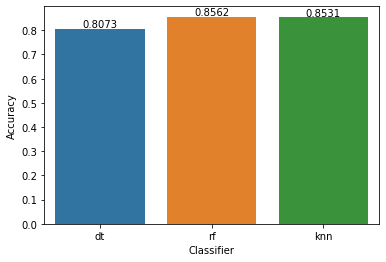

In [68]:
# Plot the accuracies
axis = sns.barplot(x = 'Name', y = 'Score', data = tr_split)
axis.set(xlabel='Classifier', ylabel='Accuracy')

for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.4f}'.format(height), ha="center") 
    
plt.show()

Random Forest and k-Nearest Neighbors both outperform the logistic regression model, each scoring about 85% accuracy.

### Outier Analysis

Before performing a Principal Component Analysis I will examine the effect of removing some outliers and features of this data.  To do this I will retrieve X2, the copy of the cleaned dataset prior to scaling and encoding.

In [69]:
X2

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,Private,77053,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,0,0
1,82,Private,132870,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,0,0
2,66,Private,186061,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,0,0
3,54,Private,140359,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,0,0
4,41,Private,264663,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,0,0
32557,27,Private,257302,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,0,0
32558,40,Private,154374,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,0,1
32559,58,Private,151910,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,0,0


First I look at capital gain, which I noted above to contain many outliers.

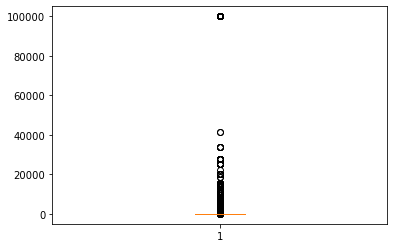

In [70]:
plt.boxplot(X2['capital.gain'])
plt.show()

In [71]:
# I calculate the quartiles and the IQR
Q1 = X2['capital.gain'].quantile(0.25)
Q3 = X2['capital.gain'].quantile(0.75)
IQR = Q3 - Q1

# The limits for outliers will be anything outside of 1.5 times the IQR in either direction.
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

In [72]:
# Finding outliers on the low end
X2[(X2['capital.gain'] < lower)]

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income


In [73]:
# Finding outliers on the high end
X2[(X2['capital.gain'] > upper)]

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1519,54,Self-emp-inc,166459,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,60,0,1
1520,52,Private,152234,9,Married-civ-spouse,Exec-managerial,Husband,Asian-Pac-Islander,Male,99999,0,40,1,1
1521,53,Self-emp-inc,263925,9,Married-civ-spouse,Sales,Husband,White,Male,99999,0,40,0,1
1522,52,Private,118025,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,99999,0,50,0,1
1523,46,Private,370119,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,60,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4226,20,Private,59948,5,Never-married,Adm-clerical,Unmarried,Black,Female,114,0,20,0,0
4227,39,Private,151023,10,Divorced,Adm-clerical,Unmarried,White,Female,114,0,45,0,0
4228,33,Private,175412,5,Divorced,Craft-repair,Unmarried,White,Male,114,0,55,0,0
4229,38,Private,254439,6,Widowed,Transport-moving,Unmarried,Black,Male,114,0,40,0,0


There are over 2700 outliers on the high end, and I will remove these rows and see the effect on the model.

In [74]:
X2 = X2[(X2['capital.gain'] <= upper)]

Next I do the same for capital loss.

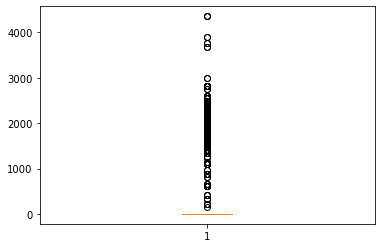

In [75]:
plt.boxplot(X2['capital.loss'])
plt.show()

In [76]:
Q1 = X2['capital.loss'].quantile(0.25)
Q3 = X2['capital.loss'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

In [77]:
X2[(X2['capital.loss'] < lower)]

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income


In [78]:
X2[(X2['capital.loss'] > upper)]

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,Private,77053,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,0,0
1,82,Private,132870,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,0,0
2,66,Private,186061,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,0,0
3,54,Private,140359,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,0,0
4,41,Private,264663,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1514,37,Private,262409,14,Divorced,Exec-managerial,Unmarried,White,Female,0,213,45,0,0
1515,38,Private,173047,13,Divorced,Adm-clerical,Unmarried,Asian-Pac-Islander,Female,0,213,40,1,0
1516,40,Private,65866,10,Divorced,Tech-support,Unmarried,White,Female,0,213,40,0,0
1517,36,Private,204590,13,Divorced,Prof-specialty,Unmarried,Black,Female,0,213,40,0,0


I remove these rows as well.

In [79]:
X2 = X2[(X2['capital.loss'] <= upper)]

Next, by the analysis from above I will drop three columns - 'fnlwgt', 'race', and 'native.country'.

In [80]:
X2.drop(columns=['fnlwgt', 'race', 'native.country'], inplace=True)

In [81]:
X2

,age,workclass,education.num,marital.status,occupation,relationship,sex,capital.gain,capital.loss,hours.per.week,income
4231,50,Self-emp-not-inc,13,Married-civ-spouse,Exec-managerial,Husband,Male,0,0,13,0
4232,38,Private,9,Divorced,Handlers-cleaners,Not-in-family,Male,0,0,40,0
4233,53,Private,7,Married-civ-spouse,Handlers-cleaners,Husband,Male,0,0,40,0
4234,28,Private,13,Married-civ-spouse,Prof-specialty,Wife,Female,0,0,40,0
4235,37,Private,14,Married-civ-spouse,Exec-managerial,Wife,Female,0,0,40,0
...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,10,Never-married,Protective-serv,Not-in-family,Male,0,0,40,0
32557,27,Private,12,Married-civ-spouse,Tech-support,Wife,Female,0,0,38,0
32558,40,Private,9,Married-civ-spouse,Machine-op-inspct,Husband,Male,0,0,40,1
32559,58,Private,9,Widowed,Adm-clerical,Unmarried,Female,0,0,40,0


In [82]:
# Creating the y and X2
y = X2['income']
X2 = X2.drop(columns=['income'])

Again I will scale the numeric columns and use Label Encoder on the categorical ones.

In [83]:
census_numerical = X2[['age', 'hours.per.week', 'capital.gain', 'capital.loss']].values

In [84]:
census_scaler = RobustScaler()
census_numerical_scaled = census_scaler.fit_transform(census_numerical)

In [85]:
X2[['age', 'hours.per.week', 'capital.gain', 'capital.loss']] = census_numerical_scaled

In [86]:
categorical = ['workclass', 'marital.status', 'occupation', 'relationship', 'sex']
for feature in categorical:
        label_encode = LabelEncoder()
        X2[feature] = label_encode.fit_transform(X2[feature])

Now this dataset is ready for modelling.

In [87]:
X2

,age,workclass,education.num,marital.status,occupation,relationship,sex,capital.gain,capital.loss,hours.per.week
4231,0.70,5,13,2,3,0,1,0.0,0.0,-4.500000
4232,0.10,3,9,0,5,1,1,0.0,0.0,0.000000
4233,0.85,3,7,2,5,0,1,0.0,0.0,0.000000
4234,-0.40,3,13,2,9,5,0,0.0,0.0,0.000000
4235,0.05,3,14,2,3,5,0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...
32556,-0.70,3,10,4,10,1,1,0.0,0.0,0.000000
32557,-0.45,3,12,2,12,5,0,0.0,0.0,-0.333333
32558,0.20,3,9,2,6,0,1,0.0,0.0,0.000000
32559,1.10,3,9,6,0,4,0,0.0,0.0,0.000000


In [88]:
# I will store a copy of this scaled and encoded dataset for use in the PCA section below
X_pca = X2.copy()

Splitting into training and testing data.

In [89]:
(X_train, X_test, y_train, y_test) = train_test_split(X2, y, test_size=0.3, random_state=0)

Fitting with the Logistic Regression algorithm.

In [90]:
logreg = LogisticRegression(solver='liblinear')

In [91]:
logreg.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [92]:
yhat_train = logreg.predict(X_train)

In [93]:
accuracy_score(yhat_train, y_train)

0.8270384751147194

In [94]:
yhat_test = logreg.predict(X_test)
accuracy_score(yhat_test, y_test)

0.8356277209083421

In [95]:
confusion_matrix(y_test, yhat_test)

array([[6612,  286],
       [1111,  490]], dtype=int64)

Removing the outliers in capital gain and capital loss and dropping the three columns has made the Logistic Regression model only very slightly better - from about 82% to 83% accuracy on the testing data.

### Principal Component Analysis

Principal Component Analysis is an unsupervised learning algorithm aimed at dimensionality reduction.  We will construct two features that are a linear combination of the features and are most informative in the spreading out of the data.  After doing this we will be able to plot a scatter plot and 3D representation of these features and fit a Logistic Regression classifier to it.  After this is finished I will examine this with a larger number of components.

In [96]:
# Retrieve stored dataset
X_pca

,age,workclass,education.num,marital.status,occupation,relationship,sex,capital.gain,capital.loss,hours.per.week
4231,0.70,5,13,2,3,0,1,0.0,0.0,-4.500000
4232,0.10,3,9,0,5,1,1,0.0,0.0,0.000000
4233,0.85,3,7,2,5,0,1,0.0,0.0,0.000000
4234,-0.40,3,13,2,9,5,0,0.0,0.0,0.000000
4235,0.05,3,14,2,3,5,0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...
32556,-0.70,3,10,4,10,1,1,0.0,0.0,0.000000
32557,-0.45,3,12,2,12,5,0,0.0,0.0,-0.333333
32558,0.20,3,9,2,6,0,1,0.0,0.0,0.000000
32559,1.10,3,9,6,0,4,0,0.0,0.0,0.000000


In [97]:
y

4231     0
4232     0
4233     0
4234     0
4235     0
        ..
32556    0
32557    0
32558    1
32559    0
32560    0
Name: income, Length: 28330, dtype: int64

First, extract the data into NumPy arrays

In [98]:
X_10 = X_pca.to_numpy()
y_10 = y.to_numpy()

Check the shapes.

In [99]:
X_10.shape

(28330, 10)

In [100]:
y_10.shape

(28330,)

Now use PCA to transform these 10 features into 2. 

In [101]:
pca = PCA(n_components=2)
pca.fit(X_10)
X = pca.transform(X_10)

Produce a DataFrame of this data.

In [102]:
df = pd.DataFrame(data=np.c_[X, y_10], columns=['Feature 1', 'Feature 2', 'Label'])
df

,Feature 1,Feature 2,Label
0,-2.852151,-1.840958,0.0
1,-1.208442,0.413912,0.0
2,-1.286428,2.315128,0.0
3,2.992101,-2.170111,0.0
4,-2.927869,-3.453742,0.0
...,...,...,...
28325,3.910717,0.256959,0.0
28326,5.921976,-0.960233,0.0
28327,-0.158590,0.545590,1.0
28328,-6.160560,1.254360,0.0


Plot the data

In [103]:
fig = px.scatter(df, x='Feature 1', y='Feature 2', color='Label')
fig.show()

Our labels 0 and 1, but we can transform these into -1s and 1s by multiplying by 2 and subtracting 1.  

In [104]:
y = (2 * y_10) - 1

In [105]:
y

array([-1, -1, -1, ...,  1, -1, -1], dtype=int64)

We can plot the data now in 3D.

In [106]:
points_colorscale = [
                     [0.0, 'rgb(239, 85, 59)'],
                     [1.0, 'rgb(99, 110, 250)'],
                    ]

layout = go.Layout(scene=dict(
                              xaxis=dict(title='Feature 1'),
                              yaxis=dict(title='Featrue 2'),
                              zaxis=dict(title='Label')
                             ),
                  )

points = go.Scatter3d(x=df['Feature 1'], 
                      y=df['Feature 2'], 
                      z=y,
                      mode='markers',
                      text=df['Label'],
                      marker=dict(
                                  size=3,
                                  color=y,
                                  colorscale=points_colorscale
                            ),
                     )

fig2 = go.Figure(data=[points], layout=layout)
fig2.show()

Now split the data into training and testing data.

In [107]:
(X_train, X_test, y_train, y_test) = train_test_split(X, y, test_size=0.3, random_state=0)

Fitting the Logistic Regression Classifier on the training data.

In [108]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

Predicting the training labels and getting training accuracy.

In [109]:
yhat_train = logreg.predict(X_train)
accuracy_score(yhat_train, y_train)

0.8202309515405174

Predicting the testing labels and getting testing accuracy.

In [110]:
yhat_test = logreg.predict(X_test)
accuracy_score(yhat_test, y_test)

0.8230380044711143

In [111]:
confusion_matrix(y_test, yhat_test)

array([[6740,  158],
       [1346,  255]], dtype=int64)

After performing the Principal Component Analysis the accuracy on the testing data remains as it previously was - right around 82%.  One final analysis will be made using the Explained Variance Ratio to try to see if there is a more appropriate number of components to use.

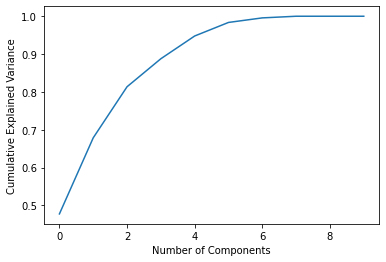

In [112]:
pca = PCA().fit(X_10)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance');

The plot indicates that 4 components will account for well over 90% of the variance in the data.  So, I will perform another PCA, this time with 4 components. 

In [113]:
pca = PCA(n_components=4)
pca.fit(X_10)
X = pca.transform(X_10)

In [114]:
df = pd.DataFrame(data=np.c_[X, y_10], columns=['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Label'])
df

,Feature 1,Feature 2,Feature 3,Feature 4,Label
0,-2.852151,-1.840958,-3.982754,-3.833849,0.0
1,-1.208442,0.413912,1.262688,-1.772951,0.0
2,-1.286428,2.315128,1.895327,-1.485917,0.0
3,2.992101,-2.170111,-2.269522,2.122219,0.0
4,-2.927869,-3.453742,-2.792132,2.002575,0.0
...,...,...,...,...,...
28325,3.910717,0.256959,-0.120490,0.491560,0.0
28326,5.921976,-0.960233,-2.070839,1.989736,0.0
28327,-0.158590,0.545590,1.114961,-1.386320,1.0
28328,-6.160560,1.254360,-1.617708,3.279740,0.0


In [115]:
# Again transform the targets into -1s and 1s
y = (2 * y_10) - 1

In [116]:
# Split the data
(X_train, X_test, y_train, y_test) = train_test_split(X, y, test_size=0.3, random_state=0)

In [117]:
# Fit the logistic regression classifier 
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

In [118]:
# Get the accuracy on the training data
yhat_train = logreg.predict(X_train)
accuracy_score(yhat_train, y_train)

0.8274923100196662

In [119]:
# Get the accuracy on the testing data
yhat_test = logreg.predict(X_test)
accuracy_score(yhat_test, y_test)

0.8328038592775621

In [120]:
# Produce the confusion matrix
confusion_matrix(y_test, yhat_test)

array([[6629,  269],
       [1152,  449]], dtype=int64)

Once again the accuracy remains basically unchanged - right around 83% for training and testing. 

### Conclusions:

This has been an analysis of the Adult Census Income dataset - trying to predict whether a given person will have an income above or below 50k based on a given fourteen factors.  EDA showed that one of these, education, was the same as education number.  

Feature engineering and data cleaning produced an accuracy score of about 82% with the logistic regression model.  Factors such as age, working hours per week, occupation, education and marital status were determined to be relevant to the classification, while others such as race and native country were not. 

The logistic regression model was compared with other classifiers and outperformed Decision Tree but fell slightly behind Random Forest and k-Nearest Neighbours.  

The removal of outliers and three columns - race, native country, and fnlwgt - did not noticeably improve the model's accuracy.

A Principal Component Analysis was conducted with both two and four features and each produced accuracies in line with each other and with the previous logistic regression scores. 